# Road Defect Detection using Faster-RCNN in DETECTRON2

# https://ai.facebook.com/blog/-detectron2-a-pytorch-based-modular-object-detection-library-/

# DETECTRON2 IMAGE:
<img src="https://dl.fbaipublicfiles.com/detectron2/Detectron2-Logo-Horz.png" width="500">

# Step1: Install detectron2

### Starts with installing a few dependencies such as Torch Vision and COCO API and check whether CUDA is available. CUDA helps in keeping track of the currently selected GPU and then install Detectron2

In [1]:
# install dependencies: 
! apt update

import subprocess
import sys
import torch

reqs = subprocess.check_output([sys.executable, '-m', 'pip', 'freeze'])
installed_packages = [r.decode().split('==')[0] for r in reqs.split()]

if 'pyyaml' not in installed_packages:
  !pip install pyyaml==5.1  

if 'detectron2' not in installed_packages:
    TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
    CUDA_VERSION = torch.__version__.split("+")[-1]
    print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
    # Install detectron2 that matches the above pytorch version
    # See https://detectron2.readthedocs.io/tutorials/install.html for instructions
    !pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/$CUDA_VERSION/torch$TORCH_VERSION/index.html
    # If there is not yet a detectron2 release that matches the given torch + CUDA version, you need to install a different pytorch.

if 'opencv-python' not in installed_packages:
    # Install opencv for python
    !pip install opencv-python==4.5.4.58
    !apt-get -y update && apt-get -y install libgl1


# Check if Tensorflow is using GPU.
from tensorflow.python.client import device_lib
print(device_lib.list_local_devices())

# Check if PyTorch is installed and using GPU.
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
print(torch.cuda.current_device())

# Check if detectron2 is installed and its version
assert torch.__version__.startswith("1.8.1")
import detectron2
print("Detectron2 Version:",detectron2.__version__)
# Setup detectron2 logger
from detectron2.utils.logger import setup_logger
setup_logger()

import matplotlib.pyplot as plt

# exit(0)  # After installation, you may need to "restart runtime" in Colab. This line can also restart runtime

Get:1 http://security.ubuntu.com/ubuntu bionic-security InRelease [88.7 kB]
Get:2 http://ppa.launchpad.net/deadsnakes/ppa/ubuntu bionic InRelease [15.9 kB]m
Get:3 http://security.ubuntu.com/ubuntu bionic-security/multiverse amd64 Packages [26.8 kB]
Get:4 http://security.ubuntu.com/ubuntu bionic-security/main amd64 Packages [2430 kB]33m
Get:5 http://archive.ubuntu.com/ubuntu bionic InRelease [242 kB]               
Get:6 http://security.ubuntu.com/ubuntu bionic-security/universe amd64 Packages [1439 kB]
Get:7 http://security.ubuntu.com/ubuntu bionic-security/restricted amd64 Packages [666 kB]33m
Get:8 http://ppa.launchpad.net/deadsnakes/ppa/ubuntu bionic/main amd64 Packages [45.3 kB]
Get:9 http://archive.ubuntu.com/ubuntu bionic-updates InRelease [88.7 kB]m
Get:10 http://archive.ubuntu.com/ubuntu bionic-backports InRelease [74.6 kB]
Get:11 http://archive.ubuntu.com/ubuntu bionic/main amd64 Packages [1344 kB]
Get:12 http://archive.ubuntu.com/ubuntu bionic/multiverse amd64 Packages [186 k

In [2]:
! nvidia-smi

Fri Nov 12 18:33:07 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.91.03    Driver Version: 460.91.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Quadro P5000        Off  | 00000000:00:05.0 Off |                  Off |
| 26%   31C    P0    41W / 180W |    219MiB / 16278MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [3]:
# Road Damage Dataset : https://data.mendeley.com/datasets/5ty2wb6gvg/1
# Download the training data from the road damage dataset url.
# Unzip the train data after download.

# os.makedirs("./data", exist_ok=True)

# Original training data set with image annotation
# Train Dataset
# ! cd data && wget -N https://md-datasets-public-files-prod.s3.eu-west-1.amazonaws.com/23c8e42c-1f62-4804-aeee-15dcf384391f && mv 23c8e42c-1f62-4804-aeee-15dcf384391f train.tar.gz && tar xvf train.tar.gz

# Data set without image annotation - for generalization testing. Test2
# ! cd data && wget -N https://md-datasets-public-files-prod.s3.eu-west-1.amazonaws.com/800b7d96-aad4-4396-a7db-f05cb6cb8270 && mv 800b7d96-aad4-4396-a7db-f05cb6cb8270 test2.tar.gz && tar xvf test2.tar.gz    

# Data set without image annotation - for generalization testing. Test1
# ! cd data && wget -N https://md-datasets-public-files-prod.s3.eu-west-1.amazonaws.com/9e48ee0f-5980-45e0-b8c0-1126c7ee21ad && mv 9e48ee0f-5980-45e0-b8c0-1126c7ee21ad test1.tar.gz && tar xvf test1.tar.gz    
    
# ! ls -l


# Step 2: Prepare and Register the Dataset

### Import a few necessary packages.

In [4]:
# import some common libraries
import numpy as np
import os, json, cv2, random
from pathlib import Path
import argparse, glob, tqdm, time
from xml.etree import ElementTree
from xml.dom import minidom
import matplotlib.pyplot as plt
from copy import deepcopy

# import some common detectron2 utilities
from detectron2.structures import BoxMode
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

#from google.colab.patches import cv2_imshow
def cv2_imshow(im):
    plt.figure(figsize=(8,8))
    plt.imshow(cv2.cvtColor(im, cv2.COLOR_BGR2RGB))



### Import a custom data configuration scripts.

In [5]:
import road_defect_dataCfg as dataCfg

dataCfg.DETECTRON2_DATASETS = os.getcwd()
dataCfg.ROADDEFECT_DATASET  = os.path.join(dataCfg.DETECTRON2_DATASETS,"data")
dataCfg.DATASET_BASE_PATH = dataCfg.ROADDEFECT_DATASET
print("Dataset Basepath: ",dataCfg.DATASET_BASE_PATH)

Dataset Basepath:  /notebooks/data


In [6]:
# Provided train data and test data

# Original training data set with image annotation
print(dataCfg._PREDEFINED_SPLITS_GRC_MD['roaddefect_source'])

# Data set without image annotation - for generalization testing.
print(dataCfg._PREDEFINED_SPLITS_GRC_MD['roaddefect_new'])

{'roaddefect_train': ('train/Czech', 'train/India', 'train/Japan')}
{'roaddefect_new_test1': ('test2/Czech', 'test2/India', 'test2/Japan')}


In [7]:
# Create the test train split for them
print(dataCfg._PREDEFINED_SPLITS_GRC_MD['roaddefect'])

{'roaddefect_train': ('ltrain/Czech', 'ltrain/India', 'ltrain/Japan'), 'roaddefect_val': ('lval/Czech', 'lval/India', 'lval/Japan'), 'roaddefect_test': ('ltest/Czech', 'ltest/India', 'ltest/Japan')}


### Split the training dataset to 80:15:5 splits
###   - 80 % data for model training
###   - 15 % data for model validation (to tune the hyper-parameters)
###   - 5 % data for model testing

In [8]:
import random
random.seed(0) 
print("\n-----------", dataCfg.DATASET_BASE_PATH, "-----------\n")

# Uncomment below and create the split dataset for model training/evluation/testing
# dataCfg.prepare_target_directories(dataCfg.DATASET_BASE_PATH, "roaddefect_source", dataCfg._PREDEFINED_SPLITS_GRC_MD["roaddefect_source"]["roaddefect_train"])
# # Setup dataset for test/train/val split
# for dataset_name, splits_per_dataset in dataCfg._PREDEFINED_SPLITS_GRC_MD["roaddefect_source"].items():
#     dataCfg.prepare_dataset_split(dataCfg.DATASET_BASE_PATH, dataset_name, splits_per_dataset)

# Check the number of files in the split dataset.
for dataset_name, splits_per_dataset in dataCfg._PREDEFINED_SPLITS_GRC_MD["roaddefect"].items():
    print(dataset_name, splits_per_dataset)
    dataCfg.check_dataset_info(dataCfg.DATASET_BASE_PATH, dataset_name, splits_per_dataset)

# Check the number of files in the source dataset.
for dataset_name, splits_per_dataset in dataCfg._PREDEFINED_SPLITS_GRC_MD["roaddefect_source"].items():
    print(dataset_name, splits_per_dataset)
    dataCfg.check_dataset_info(dataCfg.DATASET_BASE_PATH, dataset_name, splits_per_dataset)

    


----------- /notebooks/data -----------

roaddefect_train ('ltrain/Czech', 'ltrain/India', 'ltrain/Japan')
0 	Total: 2263 . Images from path =  /notebooks/data/ltrain/Czech/images
1 	Total: 6164 . Images from path =  /notebooks/data/ltrain/India/images
2 	Total: 8404 . Images from path =  /notebooks/data/ltrain/Japan/images
roaddefect_val ('lval/Czech', 'lval/India', 'lval/Japan')
0 	Total: 424 . Images from path =  /notebooks/data/lval/Czech/images
1 	Total: 1156 . Images from path =  /notebooks/data/lval/India/images
2 	Total: 1576 . Images from path =  /notebooks/data/lval/Japan/images
roaddefect_test ('ltest/Czech', 'ltest/India', 'ltest/Japan')
0 	Total: 142 . Images from path =  /notebooks/data/ltest/Czech/images
1 	Total: 386 . Images from path =  /notebooks/data/ltest/India/images
2 	Total: 526 . Images from path =  /notebooks/data/ltest/Japan/images
roaddefect_train ('train/Czech', 'train/India', 'train/Japan')
0 	Total: 2829 . Images from path =  /notebooks/data/train/Czech/

### Run a pre-trained detectron2 model

We first get an image from the train dataset and visualize it.

/notebooks/data/train/Japan/images/Japan_000000.jpg


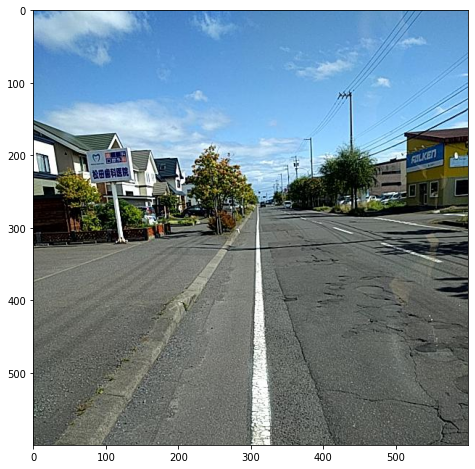

In [9]:

# !wget http://images.cocodataset.org/val2017/000000439715.jpg -q -O input.jpg
show_image_path = dataCfg.ROADDEFECT_DATASET+"/train/Japan/images/Japan_000000.jpg"
print(show_image_path)
im = cv2.imread(show_image_path)
cv2_imshow(im)

Then, we create a detectron2 config and a detectron2 `DefaultPredictor` to run inference on this image.

# Step 3: Register the Dataset

### Train on a custom dataset

In this section, we show how to train an existing detectron2 model on a custom dataset in a new format.

We'll train a model from an existing model pre-trained on COCO dataset, available in detectron2's model zoo.
Note that COCO dataset does not have these category. We'll be able to recognize this new class in a few minutes.

### Prepare the dataset


Format to dict and register dataset to detectron2, following the [detectron2 custom dataset tutorial](https://detectron2.readthedocs.io/tutorials/datasets.html).
Here, the dataset is in its custom format, therefore we write a function to parse it and prepare it into detectron2's standard format. See the tutorial for more details.


In [10]:
# Base on the tutorial from Detectron2 to setup and configure custom dataset to train the 
# basic model available in Detectron2:
# Tutorial: https://colab.research.google.com/drive/16jcaJoc6bCFAQ96jDe2HwtXj7BMD_-m5#scrollTo=7unkuuiqLdqd
    
#    
# if your dataset is in COCO format, this cell can be replaced by the following three lines:
# from detectron2.data.datasets import register_coco_instances
# register_coco_instances("my_dataset_train", {}, "json_annotation_train.json", "path/to/image/dir")
# register_coco_instances("my_dataset_val", {}, "json_annotation_val.json", "path/to/image/dir")
#

RDD_DEFECT_CATEGORIES = dataCfg.RDD_DEFECT_CATEGORIES_ALL
for item in RDD_DEFECT_CATEGORIES:
    print(item)

{'id': 1, 'name': 'D00', 'color': [220, 20, 60], 'submission_superid': 1, 'description': 'Longitudinal Crack'}
{'id': 2, 'name': 'D01', 'color': [165, 42, 42], 'submission_superid': 1, 'description': 'Longitudinal Crack'}
{'id': 3, 'name': 'D10', 'color': [0, 0, 142], 'submission_superid': 2, 'description': 'Transverse Crack'}
{'id': 4, 'name': 'D11', 'color': [0, 0, 70], 'submission_superid': 2, 'description': 'Transverse Crack'}
{'id': 5, 'name': 'D20', 'color': [0, 60, 100], 'submission_superid': 3, 'description': 'Aligator Crack'}
{'id': 6, 'name': 'D40', 'color': [0, 80, 100], 'submission_superid': 4, 'description': 'Pothole'}
{'id': 7, 'name': 'D43', 'color': [0, 0, 230], 'submission_superid': 4, 'description': 'Crosswalk blur'}
{'id': 8, 'name': 'D44', 'color': [119, 11, 32], 'submission_superid': 4, 'description': 'Whiteline blur'}
{'id': 9, 'name': 'D50', 'color': [128, 64, 128], 'submission_superid': 4, 'description': 'Manhole lid/plate'}
{'id': 10, 'name': 'D0w0', 'color': [

In [11]:
DatasetCatalog.clear()
for dataset_name, splits_per_dataset in dataCfg._PREDEFINED_SPLITS_GRC_MD["roaddefect"].items():
    inst_key = f"{dataset_name}"
    d = dataset_name.split("_")[1]
    print("[",d,"]\t",dataset_name, "\t", splits_per_dataset)
    DatasetCatalog.register(inst_key, lambda path=dataCfg.ROADDEFECT_DATASET, d=deepcopy(splits_per_dataset) : dataCfg.load_images_ann_dicts(path, d, dataCfg.RDD_DEFECT_CATEGORIES_ALL))
    meta = dataCfg.get_rdd_coco_instances_meta(dataCfg.RDD_DEFECT_CATEGORIES_ALL)
    MetadataCatalog.get(inst_key).set(evaluator_type="coco", basepath=dataCfg.ROADDEFECT_DATASET, splits_per_dataset=deepcopy(splits_per_dataset), **meta) 

[ train ]	 roaddefect_train 	 ('ltrain/Czech', 'ltrain/India', 'ltrain/Japan')
[ val ]	 roaddefect_val 	 ('lval/Czech', 'lval/India', 'lval/Japan')
[ test ]	 roaddefect_test 	 ('ltest/Czech', 'ltest/India', 'ltest/Japan')


# Step 4: Visualize the Training Set.

To verify the data loading is correct, let's visualize the annotations of randomly selected samples in the training set:



0 	Loading  424  images from path =  /notebooks/data/lval/Czech/images
1 	Loading  1156  images from path =  /notebooks/data/lval/India/images
2 	Loading  1576  images from path =  /notebooks/data/lval/Japan/images
/notebooks/data/lval/India/images/India_004671.jpg
/notebooks/data/lval/Japan/images/Japan_010319.jpg
/notebooks/data/lval/Japan/images/Japan_010429.jpg


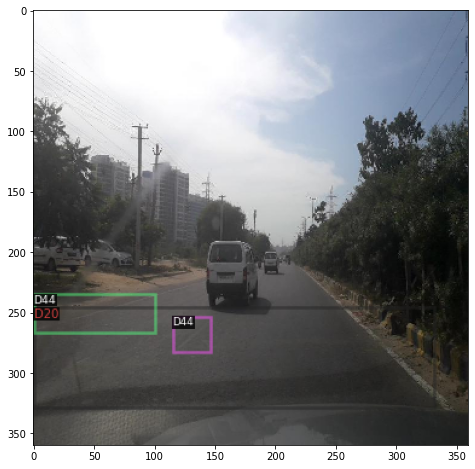

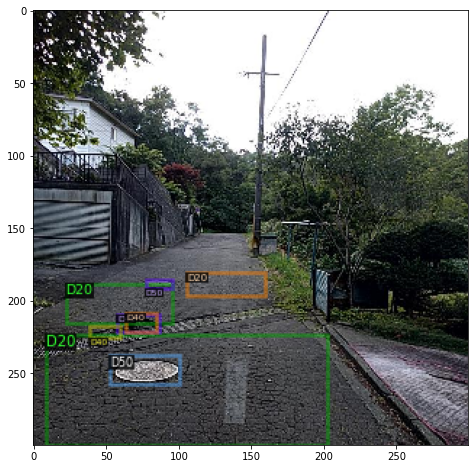

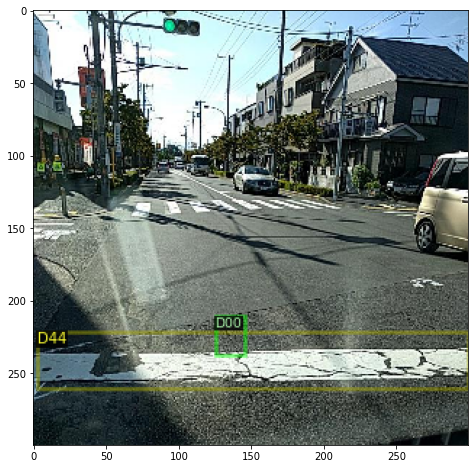

In [12]:
# Call the registered function and return its results.
rdd2020_metadata = MetadataCatalog.get("roaddefect_val")

# Visualize Training Dataset
def visualise_dataset(dataset: str = "val"):
    splits_per_dataset = ( "lval/Czech", "lval/India", "lval/Japan")
    dataset_dicts = dataCfg.load_images_ann_dicts(dataCfg.ROADDEFECT_DATASET, splits_per_dataset, dataCfg.RDD_DEFECT_CATEGORIES_ALL)
    for d in random.sample(dataset_dicts, 3):
        print(d["file_name"])
        img = cv2.imread(d["file_name"])
        visualizer = Visualizer(img[:, :, ::-1], metadata=rdd2020_metadata, scale=0.5)
        out = visualizer.draw_dataset_dict(d)
        cv2_imshow(out.get_image()[:, :, ::-1])

visualise_dataset()

# Step 5: Training the Model

Now, let's fine-tune a COCO-pretrained Faster R-CNN model on the Road Defect dataset. 


In [13]:
from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator, DatasetEvaluators


In [14]:
# Configuration
# https://detectron2.readthedocs.io/en/latest/modules/config.html?highlight=.DATASETS.TRAIN%20#yaml-config-references

MODEL_ZOO = 'R_50_FPN_3x'
print("COCO-Detection/faster_rcnn_{}.yaml".format(MODEL_ZOO))

# Obtain detectron2's default config
cfg = get_cfg()

# Load values from a file
# https://detectron2.readthedocs.io/en/v0.4/_modules/detectron2/model_zoo/model_zoo.html
#         # COCO Detection with Faster R-CNN
#         "COCO-Detection/faster_rcnn_R_50_C4_1x.yaml": "137257644/model_final_721ade.pkl",
#         "COCO-Detection/faster_rcnn_R_50_DC5_1x.yaml": "137847829/model_final_51d356.pkl",
#         "COCO-Detection/faster_rcnn_R_50_FPN_1x.yaml": "137257794/model_final_b275ba.pkl",
#         "COCO-Detection/faster_rcnn_R_50_C4_3x.yaml": "137849393/model_final_f97cb7.pkl",
#         "COCO-Detection/faster_rcnn_R_50_DC5_3x.yaml": "137849425/model_final_68d202.pkl",
#         "COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml": "137849458/model_final_280758.pkl",
#         "COCO-Detection/faster_rcnn_R_101_C4_3x.yaml": "138204752/model_final_298dad.pkl",
#         "COCO-Detection/faster_rcnn_R_101_DC5_3x.yaml": "138204841/model_final_3e0943.pkl",
#         "COCO-Detection/faster_rcnn_R_101_FPN_3x.yaml": "137851257/model_final_f6e8b1.pkl",
#         "COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml": "139173657/model_final_68b088.pkl",
# Find a model from detectron2's model zoo. You can use the https://dl.fbaipublicfiles... url as well
# cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"))
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_{}.yaml".format(MODEL_ZOO)))

# Load the pre-trained weights from the Model Zoo API for Detectron2
# - this is a collection of functions to create common model architectures
# listed in MODEL_ZOO.md -
# https://github.com/facebookresearch/detectron2/blob/main/MODEL_ZOO.md
# Let training initialize from model zoo
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_{}.yaml".format(MODEL_ZOO))

# List of the dataset names for training. Must be registered in DatasetCatalog
# Samples from these datasets will be merged and used as one dataset.
cfg.DATASETS.TRAIN = ("roaddefect_train",)
# List of the dataset names for testing. Must be registered in DatasetCatalog
cfg.DATASETS.TEST = ("roaddefect_val", )
# Directory where output files are written
cfg.OUTPUT_DIR = "./output/faster_rcnn_model/"
cfg.MODEL.DEVICE = "cuda"

# RoI minibatch size *per image* (number of regions of interest [ROIs]) during training
# Total number of RoIs per training minibatch =
#   ROI_HEADS.BATCH_SIZE_PER_IMAGE * SOLVER.IMS_PER_BATCH
# E.g., a common configuration is: 512 * 16 = 8192
# Need to select a number that would be good enough for training and at the same able to
# afford the time available for the vm to run the training., (default: 512) - can be 64, 128, 256, 512, etc
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE  = 256   
# Number of foreground classes
cfg.MODEL.ROI_HEADS.NUM_CLASSES = len(dataCfg.RDD_DEFECT_CATEGORIES_ALL) # The classes of the road defect
# Save a checkpoint after every this number of iterations
cfg.SOLVER.CHECKPOINT_PERIOD = 50

# Number of data loading threads
cfg.DATALOADER.NUM_WORKERS = 8
# Number of images per batch across all machines. This is also the number
# of training images per step (i.e. per iteration). If we use 16 GPUs
# and IMS_PER_BATCH = 32, each GPU will see 2 images per batch.
# May be adjusted automatically if REFERENCE_WORLD_SIZE is set.
cfg.SOLVER.IMS_PER_BATCH  = 8
cfg.SOLVER.BASE_LR        = 0.001      # Pick a good LR
cfg.SOLVER.WARMUP_ITERS   = 100 
cfg.SOLVER.MAX_ITER       = 1000       # You may need to train longer for a practical dataset
# The iteration number to decrease learning rate by GAMMA.
cfg.SOLVER.STEPS          = (900, 950)
cfg.SOLVER.GAMMA          = 0.05
# The period (in terms of steps) to evaluate the model during training.
# Set to 0 to disable.
cfg.TEST.EVAL_PERIOD      = 250



COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml


In [16]:
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)



class RoadDefectTrainer(DefaultTrainer):
  @classmethod
  def build_evaluator(cls, cfg, dataset_name, output_folder=None):
    if output_folder is None:
      os.makedirs(os.path.join(cfg.OUTPUT_DIR,"coco_eval.256_{}".format(MODEL_ZOO)), exist_ok=True)
#       output_folder=os.path.join(cfg.OUTPUT_DIR,"coco_eval")
      output_folder=os.path.join(cfg.OUTPUT_DIR, "coco_eval.256_{}".format(MODEL_ZOO))
      print(">>>>", output_folder)

    return COCOEvaluator(dataset_name, cfg, False, output_folder)

trainer = RoadDefectTrainer(cfg) 


# If resume==True and cfg.OUTPUT_DIR contains the last checkpoint (defined by a last_checkpoint file),
# resume from the file. Resuming means loading all available states (eg. optimizer and scheduler) 
# and update iteration counter from the checkpoint. cfg.MODEL.WEIGHTS will not be used.
# Otherwise, this is considered as an independent training. The method will load model weights
# from the file cfg.MODEL.WEIGHTS (but will not load other states) and start from iteration 0.
trainer.resume_or_load(resume=True)


[11/12 18:36:13 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_280758.pkl: 167MB [00:08, 19.4MB/s]                              
Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (11, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (11,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (40, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (40,) in the model! You might want to double check if this is expected.
Some model parameters or buffers are not found in the checkpoint:
roi_heads.

In [17]:
# Run training.
trainer.train()


[11/12 18:36:25 d2.engine.train_loop]: Starting training from iteration 0
[11/12 18:36:47 d2.utils.events]:  eta: 0:17:14  iter: 19  total_loss: 2.586  loss_cls: 2.05  loss_box_reg: 0.01599  loss_rpn_cls: 0.3639  loss_rpn_loc: 0.03103  time: 1.0280  data_time: 0.0513  lr: 0.00019081  max_mem: 5973M
[11/12 18:37:08 d2.utils.events]:  eta: 0:16:56  iter: 39  total_loss: 0.6335  loss_cls: 0.2744  loss_box_reg: 0.1338  loss_rpn_cls: 0.1456  loss_rpn_loc: 0.02777  time: 1.0433  data_time: 0.0188  lr: 0.00039061  max_mem: 5973M
[11/12 18:37:31 d2.utils.events]:  eta: 0:16:46  iter: 59  total_loss: 0.6332  loss_cls: 0.3065  loss_box_reg: 0.2134  loss_rpn_cls: 0.07498  loss_rpn_loc: 0.02854  time: 1.0632  data_time: 0.0195  lr: 0.00059041  max_mem: 5973M
[11/12 18:37:57 d2.utils.events]:  eta: 0:16:40  iter: 79  total_loss: 0.6637  loss_cls: 0.3151  loss_box_reg: 0.2262  loss_rpn_cls: 0.07451  loss_rpn_loc: 0.03771  time: 1.1255  data_time: 0.2121  lr: 0.00079021  max_mem: 5973M
[11/12 18:38:2

In [18]:
! pwd
! cd /notebooks/output/faster_rcnn_model && mkdir models 
! cd /notebooks/output/faster_rcnn_model && mv model_final.pth ./models/model_final_batch_size_256_"$MODEL_ZOO".pth


/notebooks
mkdir: cannot create directory ‘models’: File exists


In [ ]:
# Look at training curves in tensorboard:
# %load_ext tensorboard
# %tensorboard --logdir output/run_rdd/

# Step 6: Inference using the trained model
Now, let's run inference with the trained model on the balloon validation dataset. First, let's create a predictor using the model we just trained:



In [19]:
# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "models", "model_final_batch_size_256_{}.pth".format(MODEL_ZOO))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # set a custom testing threshold for this model
cfg.DATASETS.TEST = ("roaddefect_test",)
predictor = DefaultPredictor(cfg)

Then, we randomly select several samples to visualize the prediction results.

0 	Loading  386  images from path =  /notebooks/data/ltest/India/images
1 	Loading  526  images from path =  /notebooks/data/ltest/Japan/images
2 	Loading  142  images from path =  /notebooks/data/ltest/Czech/images
0 .)  - /notebooks/data/ltest/India/images/India_004781.jpg tensor([], device='cuda:0', dtype=torch.int64)
      tensor([], device='cuda:0')
1 .)  - /notebooks/data/ltest/Japan/images/Japan_003557.jpg tensor([7, 2, 7], device='cuda:0')
      tensor([0.8346, 0.6798, 0.5229], device='cuda:0')
2 .)  - /notebooks/data/ltest/Czech/images/Czech_000663.jpg tensor([8, 7, 8, 7], device='cuda:0')
      tensor([0.8528, 0.7117, 0.6243, 0.5772], device='cuda:0')


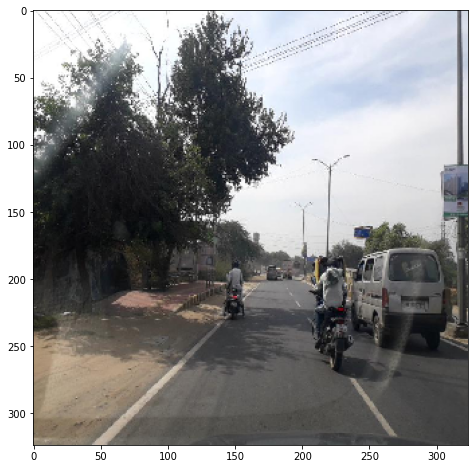

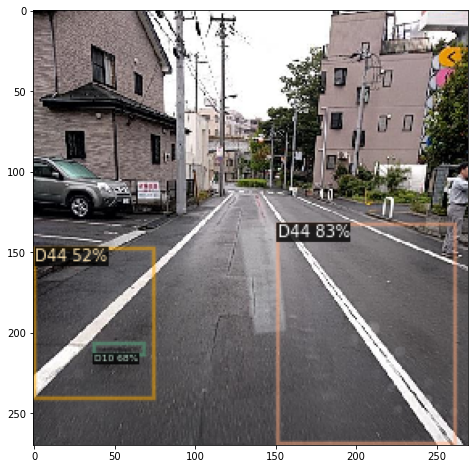

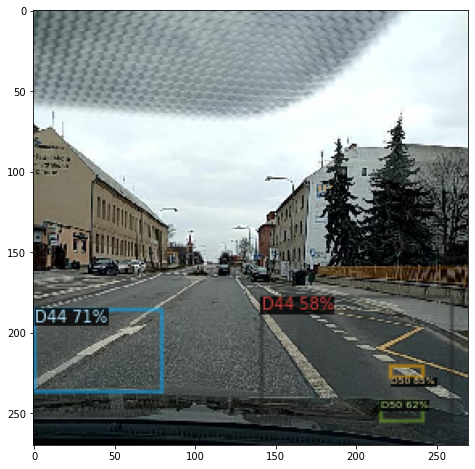

In [20]:
from detectron2.utils.visualizer import ColorMode
    
splits_per_dataset = ( "ltest/India", "ltest/Japan", "ltest/Czech")
dataset_dicts = dataCfg.load_images_ann_dicts(dataCfg.ROADDEFECT_DATASET, splits_per_dataset, dataCfg.RDD_DEFECT_CATEGORIES_ALL)

for idx, d in enumerate(random.sample(dataset_dicts, 3)):
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    
    print(idx, ".) ", "-", d["file_name"], outputs["instances"].pred_classes)
    print("     ", outputs["instances"].scores)
    v = Visualizer(im[:, :, ::-1],
                   metadata=rdd2020_metadata, 
                   scale=0.45
    )

    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

# Step 7: Evaluation of the trained model

We can also evaluate its performance using AP metric implemented in COCO API.


In [21]:
from detectron2.evaluation import COCOEvaluator, DatasetEvaluators, inference_on_dataset
from detectron2.data import build_detection_test_loader

output_folder=os.path.join(cfg.OUTPUT_DIR, "coco_eval.256_{}".format(MODEL_ZOO))
print(output_folder)

evaluator = COCOEvaluator("roaddefect_val", cfg, False, output_folder)
test_loader = build_detection_test_loader(cfg, "roaddefect_val")
eval_results = inference_on_dataset(trainer.model, test_loader, DatasetEvaluators([evaluator]))

# another equivalent way is to use trainer.test
print(eval_results)

./output/faster_rcnn_model/coco_eval.256_R_50_FPN_3x
WARNING [11/12 19:11:28 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
0 	Loading  424  images from path =  /notebooks/data/lval/Czech/images
1 	Loading  1156  images from path =  /notebooks/data/lval/India/images
2 	Loading  1576  images from path =  /notebooks/data/lval/Japan/images
[11/12 19:11:29 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[11/12 19:11:29 d2.data.common]: Serializing 3156 elements to byte tensors and concatenating them all ...
[11/12 19:11:29 d2.data.common]: Serialized dataset takes 1.12 MiB
[11/12 19:11:29 d2.evaluation.evaluator]: Start inference on 3156 batches
[11/12 19:11:30 d2.evaluation.evaluator]: Inference done 11/3156. Dataloading: 0.0015 s/iter. Inference: 0.0681 s/iter. Eval: 0.0003 s/i